## Goal

(mean/zero) ablate each DiT head


See visually how the output changed

How to achieve this?

ZERO EVERYTHING ONE THING AT A TIME


> In exploratory patching we typically patch components one at a time, often in a sweep over the model (layers, positions, model components). We do this to get an idea of which parts of a model are involved in the task in question, and may be part of the corresponding circuit.

Findings (research log):

1. якщо замінити хіденстейти в головах з кави на яблуко, то генерується яблуко. Шо це? Це озночає шо весь текст додається в головах.

## Implementation

In [1]:
import torch
from diffusers import StableDiffusion3Pipeline

In [2]:
from tqdm.auto import tqdm

In [2]:
# ! pip install accelerate

In [ ]:
from huggingface_hub import login
login()

In [3]:
pipe = StableDiffusion3Pipeline.from_pretrained("stabilityai/stable-diffusion-3-medium-diffusers", torch_dtype=torch.float16)
pipe = pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/9 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [4]:
from diffusers.models.attention_processor import Attention

In [5]:
import torch
from torch import nn
from torch.nn import functional as F
from typing import Optional

In [118]:
class BANANA_ZERO_HEAD_ABL_JointAttnProcessor2_0:
    """Attention processor used typically in processing the SD3-like self-attention projections."""

    def __init__(self, head_idx=tuple()):
        self.head_idx = head_idx
        self.single_print_flag = False
        if not hasattr(F, "scaled_dot_product_attention"):
            raise ImportError("AttnProcessor2_0 requires PyTorch 2.0, to use it, please upgrade PyTorch to 2.0.")

    def __call__(
        self,
        attn: Attention,
        hidden_states: torch.FloatTensor,
        encoder_hidden_states: torch.FloatTensor = None,
        attention_mask: Optional[torch.FloatTensor] = None,
        *args,
        **kwargs,
    ) -> torch.FloatTensor:
        residual = hidden_states

        input_ndim = hidden_states.ndim
        if input_ndim == 4:
            batch_size, channel, height, width = hidden_states.shape
            hidden_states = hidden_states.view(batch_size, channel, height * width).transpose(1, 2)
        context_input_ndim = encoder_hidden_states.ndim
        if context_input_ndim == 4:
            batch_size, channel, height, width = encoder_hidden_states.shape
            encoder_hidden_states = encoder_hidden_states.view(batch_size, channel, height * width).transpose(1, 2)

        batch_size = encoder_hidden_states.shape[0]

        # `sample` projections.
        query = attn.to_q(hidden_states)
        key = attn.to_k(hidden_states)
        value = attn.to_v(hidden_states)

        # `context` projections.
        encoder_hidden_states_query_proj = attn.add_q_proj(encoder_hidden_states)
        encoder_hidden_states_key_proj = attn.add_k_proj(encoder_hidden_states)
        encoder_hidden_states_value_proj = attn.add_v_proj(encoder_hidden_states)

        # attention
        query = torch.cat([query, encoder_hidden_states_query_proj], dim=1)
        key = torch.cat([key, encoder_hidden_states_key_proj], dim=1)
        value = torch.cat([value, encoder_hidden_states_value_proj], dim=1)

        inner_dim = key.shape[-1]
        head_dim = inner_dim // attn.heads
        query = query.view(batch_size, -1, attn.heads, head_dim).transpose(1, 2)
        key = key.view(batch_size, -1, attn.heads, head_dim).transpose(1, 2)
        value = value.view(batch_size, -1, attn.heads, head_dim).transpose(1, 2)

        hidden_states = F.scaled_dot_product_attention(query, key, value, dropout_p=0.0, is_causal=False)

        for head_i in self.head_idx:
            if not self.single_print_flag:

                self.single_print_flag = True
                print(f'zero abl {head_i=}')
            hidden_states[:, head_i] = 0.0

        hidden_states = hidden_states.transpose(1, 2).reshape(batch_size, -1, attn.heads * head_dim)
        hidden_states = hidden_states.to(query.dtype)

        # Split the attention outputs.
        hidden_states, encoder_hidden_states = (
            hidden_states[:, : residual.shape[1]],
            hidden_states[:, residual.shape[1] :],
        )

        # linear proj
        hidden_states = attn.to_out[0](hidden_states)
        # dropout
        hidden_states = attn.to_out[1](hidden_states)
        if not attn.context_pre_only:
            encoder_hidden_states = attn.to_add_out(encoder_hidden_states)

        if input_ndim == 4:
            hidden_states = hidden_states.transpose(-1, -2).reshape(batch_size, channel, height, width)
        if context_input_ndim == 4:
            encoder_hidden_states = encoder_hidden_states.transpose(-1, -2).reshape(batch_size, channel, height, width)

        return hidden_states, encoder_hidden_states

HIDDEN_STATES = dict()


class BANANA_SAVER_JointAttnProcessor2_0:
    """Attention processor used typically in processing the SD3-like self-attention projections."""

    def __init__(self, layer_i):
        self.layer_i = layer_i
        self.single_print_flag = False
        if not hasattr(F, "scaled_dot_product_attention"):
            raise ImportError("AttnProcessor2_0 requires PyTorch 2.0, to use it, please upgrade PyTorch to 2.0.")

    def __call__(
        self,
        attn: Attention,
        hidden_states: torch.FloatTensor,
        encoder_hidden_states: torch.FloatTensor = None,
        attention_mask: Optional[torch.FloatTensor] = None,
        *args,
        **kwargs,
    ) -> torch.FloatTensor:
        residual = hidden_states

        input_ndim = hidden_states.ndim
        if input_ndim == 4:
            batch_size, channel, height, width = hidden_states.shape
            hidden_states = hidden_states.view(batch_size, channel, height * width).transpose(1, 2)
        context_input_ndim = encoder_hidden_states.ndim
        if context_input_ndim == 4:
            batch_size, channel, height, width = encoder_hidden_states.shape
            encoder_hidden_states = encoder_hidden_states.view(batch_size, channel, height * width).transpose(1, 2)

        batch_size = encoder_hidden_states.shape[0]

        # `sample` projections.
        query = attn.to_q(hidden_states)
        key = attn.to_k(hidden_states)
        value = attn.to_v(hidden_states)

        # `context` projections.
        encoder_hidden_states_query_proj = attn.add_q_proj(encoder_hidden_states)
        encoder_hidden_states_key_proj = attn.add_k_proj(encoder_hidden_states)
        encoder_hidden_states_value_proj = attn.add_v_proj(encoder_hidden_states)

        # attention
        query = torch.cat([query, encoder_hidden_states_query_proj], dim=1)
        key = torch.cat([key, encoder_hidden_states_key_proj], dim=1)
        value = torch.cat([value, encoder_hidden_states_value_proj], dim=1)

        inner_dim = key.shape[-1]
        head_dim = inner_dim // attn.heads
        query = query.view(batch_size, -1, attn.heads, head_dim).transpose(1, 2)
        key = key.view(batch_size, -1, attn.heads, head_dim).transpose(1, 2)
        value = value.view(batch_size, -1, attn.heads, head_dim).transpose(1, 2)

        hidden_states = F.scaled_dot_product_attention(query, key, value, dropout_p=0.0, is_causal=False)

        for head_i in range(NUM_HEADS):            
            HIDDEN_STATES[(self.layer_i, head_i)] = hidden_states[:, head_i].clone().detach().cpu()

        hidden_states = hidden_states.transpose(1, 2).reshape(batch_size, -1, attn.heads * head_dim)
        hidden_states = hidden_states.to(query.dtype)

        # Split the attention outputs.
        hidden_states, encoder_hidden_states = (
            hidden_states[:, : residual.shape[1]],
            hidden_states[:, residual.shape[1] :],
        )

        # linear proj
        hidden_states = attn.to_out[0](hidden_states)
        # dropout
        hidden_states = attn.to_out[1](hidden_states)
        if not attn.context_pre_only:
            encoder_hidden_states = attn.to_add_out(encoder_hidden_states)

        if input_ndim == 4:
            hidden_states = hidden_states.transpose(-1, -2).reshape(batch_size, channel, height, width)
        if context_input_ndim == 4:
            encoder_hidden_states = encoder_hidden_states.transpose(-1, -2).reshape(batch_size, channel, height, width)

        return hidden_states, encoder_hidden_states


# for layer_i in range(NUM_LAYERS):
#     pipe.transformer.transformer_blocks[layer].attn.processor = BANANA_SAVER_JointAttnProcessor2_0(layer_i=layer_i)
import pickle

def write_pickle(filename, obj):
    with open(filename, 'wb') as handle:
        pickle.dump(obj, handle)

def read_pickle(filename):
    with open(filename, 'rb') as handle:
        return pickle.load(handle)
        
# MEGA_HIDDEN_STATESMEGA_HIDDEN_STATES = read_pickle("MEGA_HIDDEN_STATES.pickle")

#TODO: replace ZERO on APPLE
class BANANA_ZERO_HEAD_REPLACER_JointAttnProcessor2_0:
    """Attention processor used typically in processing the SD3-like self-attention projections."""

    def __init__(self, layer_i, head_idx=tuple()):
        self.head_idx = head_idx
        self.layer_i = layer_i
        self.single_print_flag = False
        if not hasattr(F, "scaled_dot_product_attention"):
            raise ImportError("AttnProcessor2_0 requires PyTorch 2.0, to use it, please upgrade PyTorch to 2.0.")

    def __call__(
        self,
        attn: Attention,
        hidden_states: torch.FloatTensor,
        encoder_hidden_states: torch.FloatTensor = None,
        attention_mask: Optional[torch.FloatTensor] = None,
        *args,
        **kwargs,
    ) -> torch.FloatTensor:
        residual = hidden_states

        input_ndim = hidden_states.ndim
        if input_ndim == 4:
            batch_size, channel, height, width = hidden_states.shape
            hidden_states = hidden_states.view(batch_size, channel, height * width).transpose(1, 2)
        context_input_ndim = encoder_hidden_states.ndim
        if context_input_ndim == 4:
            batch_size, channel, height, width = encoder_hidden_states.shape
            encoder_hidden_states = encoder_hidden_states.view(batch_size, channel, height * width).transpose(1, 2)

        batch_size = encoder_hidden_states.shape[0]

        # `sample` projections.
        query = attn.to_q(hidden_states)
        key = attn.to_k(hidden_states)
        value = attn.to_v(hidden_states)

        # `context` projections.
        encoder_hidden_states_query_proj = attn.add_q_proj(encoder_hidden_states)
        encoder_hidden_states_key_proj = attn.add_k_proj(encoder_hidden_states)
        encoder_hidden_states_value_proj = attn.add_v_proj(encoder_hidden_states)

        # attention
        query = torch.cat([query, encoder_hidden_states_query_proj], dim=1)
        key = torch.cat([key, encoder_hidden_states_key_proj], dim=1)
        value = torch.cat([value, encoder_hidden_states_value_proj], dim=1)

        inner_dim = key.shape[-1]
        head_dim = inner_dim // attn.heads
        query = query.view(batch_size, -1, attn.heads, head_dim).transpose(1, 2)
        key = key.view(batch_size, -1, attn.heads, head_dim).transpose(1, 2)
        value = value.view(batch_size, -1, attn.heads, head_dim).transpose(1, 2)

        hidden_states = F.scaled_dot_product_attention(query, key, value, dropout_p=0.0, is_causal=False)

        for head_i in self.head_idx:
            if not self.single_print_flag:

                self.single_print_flag = True
                print(f'zero abl {head_i=}')
            # hidden_states[:, head_i] = 0.0
            # hidden_states[:, head_i][:4] = MEGA_HIDDEN_STATES['apple'][(self.layer_i,head_i)][:4].to(value.device)
            hidden_states[:, head_i] = MEGA_HIDDEN_STATES['apple'][(self.layer_i,head_i)].to(value.device)

        hidden_states = hidden_states.transpose(1, 2).reshape(batch_size, -1, attn.heads * head_dim)
        hidden_states = hidden_states.to(query.dtype)

        # Split the attention outputs.
        hidden_states, encoder_hidden_states = (
            hidden_states[:, : residual.shape[1]],
            hidden_states[:, residual.shape[1] :],
        )

        # linear proj
        hidden_states = attn.to_out[0](hidden_states)
        # dropout
        hidden_states = attn.to_out[1](hidden_states)
        if not attn.context_pre_only:
            encoder_hidden_states = attn.to_add_out(encoder_hidden_states)

        if input_ndim == 4:
            hidden_states = hidden_states.transpose(-1, -2).reshape(batch_size, channel, height, width)
        if context_input_ndim == 4:
            encoder_hidden_states = encoder_hidden_states.transpose(-1, -2).reshape(batch_size, channel, height, width)

        return hidden_states, encoder_hidden_states

In [121]:
import torch.nn.functional as F

In [122]:
F.mse_loss

Signature:
F.mse_loss(
    input: torch.Tensor,
    target: torch.Tensor,
    size_average: Optional[bool] = None,
    reduce: Optional[bool] = None,
    reduction: str = 'mean',
) -> torch.Tensor
Docstring:
mse_loss(input, target, size_average=None, reduce=None, reduction='mean') -> Tensor

Measures the element-wise mean squared error.
See :class:`~torch.nn.MSELoss` for details.
File:      ~/miniconda3/envs/arena30/lib/python3.10/site-packages/torch/nn/functional.py
Type:      function

In [120]:
MEGA_HIDDEN_STATES.values

dict_keys(['apple', 'bicycle', 'camera', 'dragon', 'elephant', 'flower', 'guitar', 'honey', 'island', 'jacket'])

In [114]:
MEGA_HIDDEN_STATES['apple'][(0,0)].shape

torch.Size([8, 2637, 64])

In [7]:
config = pipe.transformer.config
NUM_LAYERS = config['num_layers']
NUM_HEADS = config['num_attention_heads']
ATTENTION_HEAD_DIM = config['attention_head_dim']

print(f'{NUM_LAYERS=}')
print(f'{NUM_HEADS=}')
print(f'{ATTENTION_HEAD_DIM=}')
# config

NUM_LAYERS=24
NUM_HEADS=24
ATTENTION_HEAD_DIM=64


In [8]:
from PIL import Image
import math

def create_collage(images, size=(1024, 1024)):
    # Determine the layout
    num_images = len(images)
    cols = math.ceil(math.sqrt(num_images))
    rows = math.ceil(num_images / cols)

    # Calculate the size for each image
    img_width = size[0] // cols
    img_height = size[1] // rows

    # Create a new image with the fixed size
    collage = Image.new('RGB', size)

    # Paste images into the collage
    x_offset = 0
    y_offset = 0
    for i, img in enumerate(images):
        # Resize and crop the image to fit
        img_aspect = img.width / img.height
        cell_aspect = img_width / img_height
        if img_aspect > cell_aspect:
            new_width = int(img_height * img_aspect)
            img = img.resize((new_width, img_height), Image.LANCZOS)
            left = (new_width - img_width) // 2
            img = img.crop((left, 0, left + img_width, img_height))
        else:
            new_height = int(img_width / img_aspect)
            img = img.resize((img_width, new_height), Image.LANCZOS)
            top = (new_height - img_height) // 2
            img = img.crop((0, top, img_width, top + img_height))

        collage.paste(img, (x_offset, y_offset))
        x_offset += img_width
        if (i + 1) % cols == 0:
            x_offset = 0
            y_offset += img_height

    # Save the collage
    return collage

In [9]:
import os
import random
import numpy as np
import torch

def seed_all(seed):
  random.seed(seed)
  os.environ['PYTHONHASHSEED'] = str(seed)
  np.random.seed(seed)
  torch.manual_seed(seed)
  torch.cuda.manual_seed(seed)
  torch.backends.cudnn.deterministic = True

In [10]:
from pathlib import Path

OUTPUT_DIR = Path('./experimental_artifacts/zero_abl_00')
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
# PROMPT = "A monkey holding a sign reading ”Scaling transformer models is awesome!”"

words = ["apple", "bicycle", "camera", "dragon", "elephant", "flower", "guitar", "honey", "island", "jacket",
         "kangaroo", "lamp", "mountain", "notebook", "octopus", "piano", "quartz", "rocket", "sandwich", "telescope",
         "umbrella", "violin", "whale", "xylophone", "yacht", "zebra", "airplane", "butterfly", "crystal", "desert",
         "engine", "fountain", "glacier", "helicopter", "igloo", "jungle", "koala", "lava", "microphone", "nebula",
         "ostrich", "penguin", "quasar", "river", "spaceship", "tree", "unicorn", "volcano", "waterfall", "xenon",
         "yogurt", "zeppelin", "accordion", "balloon", "cactus", "dolphin", "envelope", "firework", "galaxy", "hammock",
         "icicle", "jewel", "kettle", "lighthouse", "mosaic", "narwhal", "ocean", "parrot", "quill", "rainbow",
         "snowflake", "tractor", "universe", "vase", "windmill", "x-ray", "yawn", "zipper", "asteroid", "blossom",
         "comet", "dandelion", "eruption", "feather", "geyser", "horizon", "insect", "jigsaw", "kaleidoscope",
         "lynx", "meteor", "noodle", "orchid", "pyramid", "quicksand", "reef", "satellite", "tornado", "utopia"]

PROMPT = "A burger patty, with the bottom bun and lettuce and tomatoes. ”COFFEE” written on it in mustard"

NUM_IMAGES_PER_RUN = 4
SEED = 42

In [ ]:
((22, 4), 1.3720703125),
 ((14, 13), 1.1337890625),
 ((22, 2), 1.1064453125),

In [33]:
def run_head_ablation_experiment(layer, head, prompt=PROMPT, ablate=True):
    seed_all(SEED)

    HIDDEN_STATES = dict()

    # heads_to_ablate = {
    #     layer: [head],
    # }

    # heads_to_ablate = {
    #     22:[2, 4],
    #     14:[13],
    # }

    # heads_to_ablate = {22: [4, 2, 14, 6], 14: [13], 20: [23], 17: [17], 19: [5, 13], 21: [5]}
    heads_to_ablate = {22: [4, 2, 14, 6], 14: [13], 20: [23], 19: [5, 13], 17: [17], 21: [5]}
    # heads_to_ablate = {1: [14, 16, 10, 19, 11, 12], 0: [4, 19, 8], 3: [9]}
    
    for layer in range(NUM_LAYERS):
        pipe.transformer.transformer_blocks[layer].attn.processor = BANANA_ZERO_HEAD_ABL_JointAttnProcessor2_0(head_idx=[])

    if ablate:
        for layer, head_idx in heads_to_ablate.items():
            pipe.transformer.transformer_blocks[layer].attn.processor = BANANA_ZERO_HEAD_ABL_JointAttnProcessor2_0(head_idx=head_idx)

    images = pipe(
        prompt,
        negative_prompt="",
        num_inference_steps=28,
        guidance_scale=7.0,
        num_images_per_prompt=NUM_IMAGES_PER_RUN,
        height=768,
        width =768,
        generator = torch.Generator(device="cuda:0").manual_seed(SEED)
    ).images

    image_paths = []
    for i, image in enumerate(images):
        if ablate:
            out_path = OUTPUT_DIR / f"layer_{layer}_head_{head}_run_{i}.png"
        else:
            out_path = OUTPUT_DIR / f"base_{i}.png"
        
        image.save(out_path)
        image_paths.append(str(out_path))
    return images, image_paths

In [34]:
prompt = "A burger patty, with the bottom bun and lettuce and tomatoes. ”apple” written on it in mustard"

In [35]:
images, image_paths = run_head_ablation_experiment(1, 2, prompt=prompt)

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=13
zero abl head_i=17
zero abl head_i=5
zero abl head_i=23
zero abl head_i=5
zero abl head_i=4


In [59]:
rating = read_pickle("layer_head_diffs.pickle")

patch_layer2head_idx={22: [4, 2, 14, 6], 14: [13], 20: [23], 19: [5, 13], 17: [17], 21: [5]}
PATCH_TOP_K_HEADS=10


  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=13
zero abl head_i=17
zero abl head_i=5
zero abl head_i=23
zero abl head_i=5
zero abl head_i=4


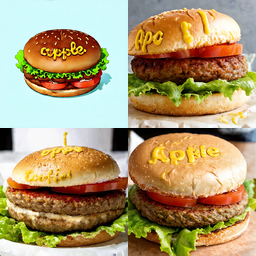

In [119]:
seed_all(SEED)

stored_images = []

prompt = f"A burger patty, with the bottom bun and lettuce and tomatoes. ”COFFEE” written on it in mustard"
# prompt = f"A monkey holding a sign reading ”Scaling transformer models is awesome!"
# prompt = f"A monkey holding a sign reading ”COFFEE”"

HIDDEN_STATES = dict()

PATCH_TOP_K_HEADS = 30

# for PATCH_TOP_K_HEADS in range(1, 200, 3):
for PATCH_TOP_K_HEADS in [10]:

    k = 0
    
    patch_layer2head_idx = {}
    for (layer_i, head_i), _ in sorted(rating, key=lambda x: -x[1]):
        patch_layer2head_idx[layer_i] = patch_layer2head_idx.get(layer_i, []) + [head_i]
    
        k += 1
        if k >= PATCH_TOP_K_HEADS:
            break
    
    print(f'{patch_layer2head_idx=}')
    print(f'{PATCH_TOP_K_HEADS=}')
    
    # remove previous processors
    for layer_i in range(NUM_LAYERS):
        pipe.transformer.transformer_blocks[layer_i].attn.processor = BANANA_ZERO_HEAD_REPLACER_JointAttnProcessor2_0(layer_i=layer_i, head_idx=[])
    
    for layer_i, head_idx in patch_layer2head_idx.items():
        pipe.transformer.transformer_blocks[layer_i].attn.processor = BANANA_ZERO_HEAD_REPLACER_JointAttnProcessor2_0(layer_i=layer_i, head_idx=head_idx)
    
    images = pipe(
        prompt,
        negative_prompt="",
        num_inference_steps=28,
        guidance_scale=7.0,
        num_images_per_prompt=NUM_IMAGES_PER_RUN,
        height=768,
        width =768,
        generator = torch.Generator(device="cuda:0").manual_seed(SEED)
    ).images
        
    stored_images.append(images)

    # collage = create_collage(images,  size=(1024, 1024))
    # collage.save(f'coffe_to_apple_images/{PATCH_TOP_K_HEADS:04}.png')
    
    display(create_collage(images, size=(256, 256)))

In [ ]:
seed_all(SEED)

stored_images = []

prompt = f"A burger patty, with the bottom bun and lettuce and tomatoes. ”COFFEE” written on it in mustard"
# prompt = f"A monkey holding a sign reading ”Scaling transformer models is awesome!"
# prompt = f"A monkey holding a sign reading ”COFFEE”"

HIDDEN_STATES = dict()

PATCH_TOP_K_HEADS = 30

# for PATCH_TOP_K_HEADS in range(1, 200, 3):
for PATCH_TOP_K_HEADS in tqdm(list(range(24*24))):

    k = 0
    
    patch_layer2head_idx = {}
    for (layer_i, head_i), _ in sorted(rating, key=lambda x: -x[1]):
        patch_layer2head_idx[layer_i] = patch_layer2head_idx.get(layer_i, []) + [head_i]
    
        k += 1
        if k >= PATCH_TOP_K_HEADS:
            break
    
    print(f'{patch_layer2head_idx=}')
    print(f'{PATCH_TOP_K_HEADS=}')
    
    # remove previous processors
    for layer_i in range(NUM_LAYERS):
        pipe.transformer.transformer_blocks[layer_i].attn.processor = BANANA_ZERO_HEAD_REPLACER_JointAttnProcessor2_0(layer_i=layer_i, head_idx=[])
    
    for layer_i, head_idx in patch_layer2head_idx.items():
        pipe.transformer.transformer_blocks[layer_i].attn.processor = BANANA_ZERO_HEAD_REPLACER_JointAttnProcessor2_0(layer_i=layer_i, head_idx=head_idx)
    
    images = pipe(
        prompt,
        negative_prompt="",
        num_inference_steps=28,
        guidance_scale=7.0,
        num_images_per_prompt=NUM_IMAGES_PER_RUN,
        height=768,
        width =768,
        generator = torch.Generator(device="cuda:0").manual_seed(SEED)
    ).images
        
    stored_images.append(images)

    collage = create_collage(images,  size=(1024, 1024))
    collage.save(f'coffe_to_apple_images/{PATCH_TOP_K_HEADS:04}.png')
    
    display(create_collage(images, size=(256, 256)))

1. 10 words -> pipe -> save activations
2. get act diff -> sort heads importance by act diff
3. replace clean heads by apple heads

In [73]:
import pickle

def write_pickle(filename, obj):
    with open(filename, 'wb') as handle:
        pickle.dump(obj, handle)

def read_pickle(filename):
    with open(filename, 'rb') as handle:
        return pickle.load(handle)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

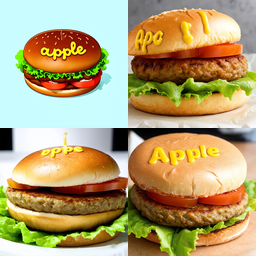

  0%|          | 0/28 [00:00<?, ?it/s]

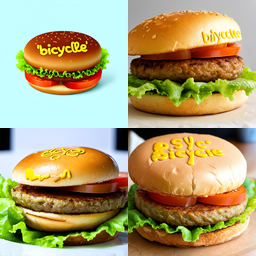

  0%|          | 0/28 [00:00<?, ?it/s]

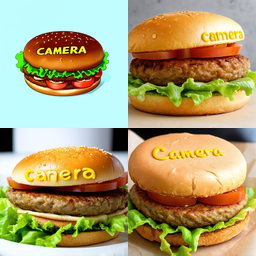

  0%|          | 0/28 [00:00<?, ?it/s]

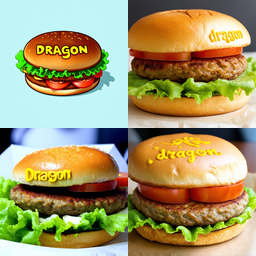

  0%|          | 0/28 [00:00<?, ?it/s]

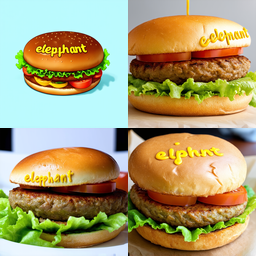

  0%|          | 0/28 [00:00<?, ?it/s]

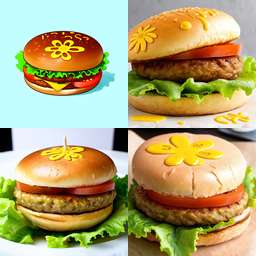

  0%|          | 0/28 [00:00<?, ?it/s]

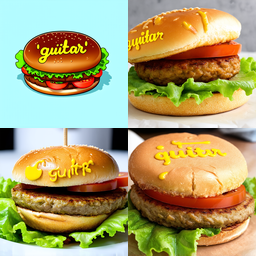

  0%|          | 0/28 [00:00<?, ?it/s]

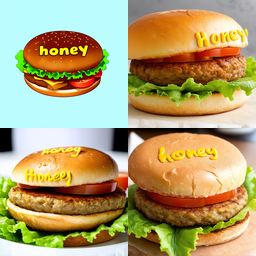

  0%|          | 0/28 [00:00<?, ?it/s]

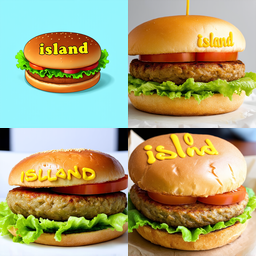

  0%|          | 0/28 [00:00<?, ?it/s]

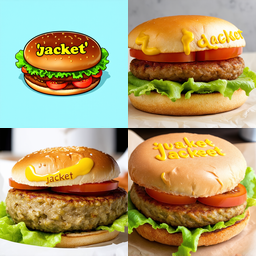

In [97]:
seed_all(SEED)

MEGA_HIDDEN_STATES = dict()

for word in tqdm(words[:10]):
    prompt = f"A burger patty, with the bottom bun and lettuce and tomatoes. ”{word}” written on it in mustard"

    HIDDEN_STATES = dict()
    for layer_i in range(NUM_LAYERS):
        pipe.transformer.transformer_blocks[layer_i].attn.processor = BANANA_SAVER_JointAttnProcessor2_0(layer_i=layer_i)
        
    images = pipe(
        prompt,
        negative_prompt="",
        num_inference_steps=28,
        guidance_scale=7.0,
        num_images_per_prompt=NUM_IMAGES_PER_RUN,
        height=768,
        width =768,
        generator = torch.Generator(device="cuda:0").manual_seed(SEED)
    ).images

    MEGA_HIDDEN_STATES[word] = HIDDEN_STATES
    write_pickle("MEGA_HIDDEN_STATES.pickle", MEGA_HIDDEN_STATES)
    
    display(create_collage(images, size=(256, 256)))

In [74]:
write_pickle("MEGA_HIDDEN_STATES.pickle", MEGA_HIDDEN_STATES)

  0%|          | 0/576 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=23


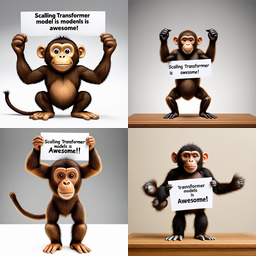

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=22


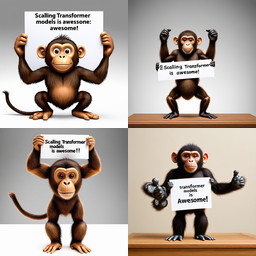

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=21


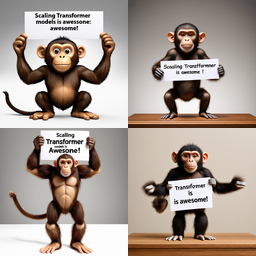

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=20


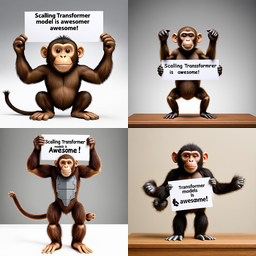

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=19


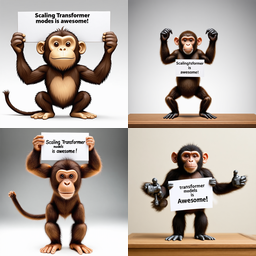

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=18


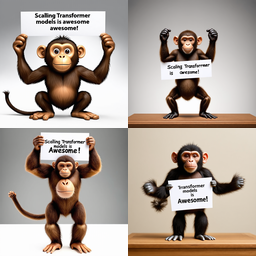

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=17


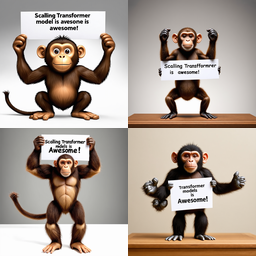

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=16


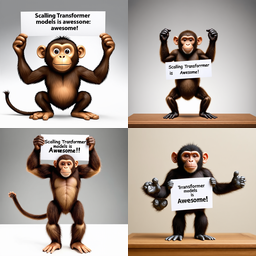

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=15


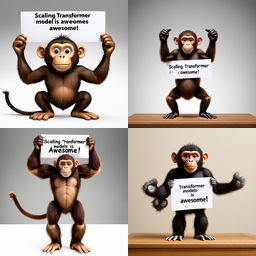

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=14


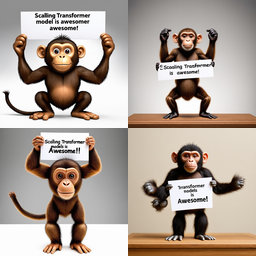

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=13


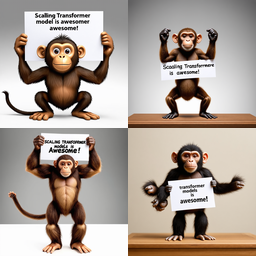

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=12


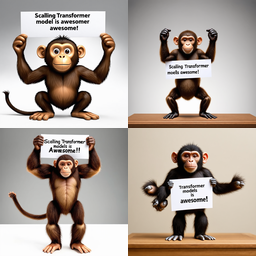

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=11


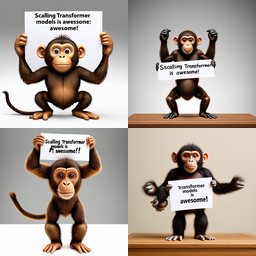

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=10


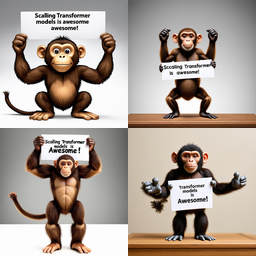

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=9


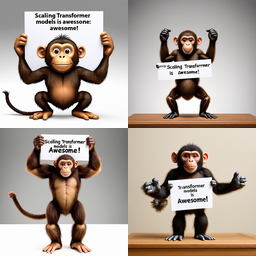

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=8


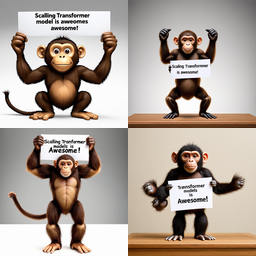

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=7


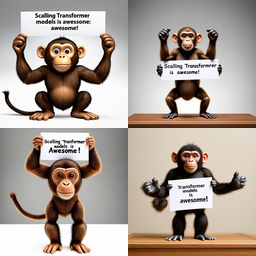

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=6


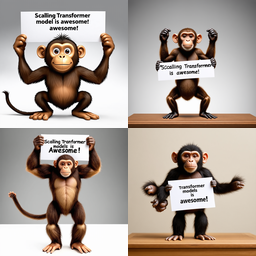

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=5


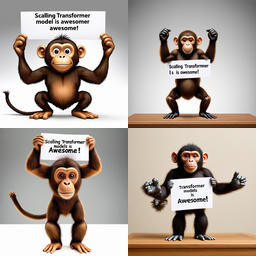

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=4


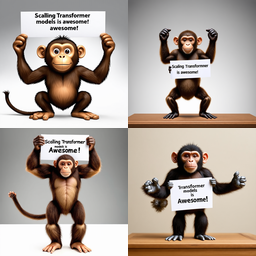

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=3


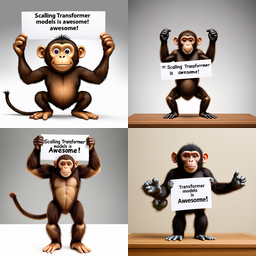

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=2


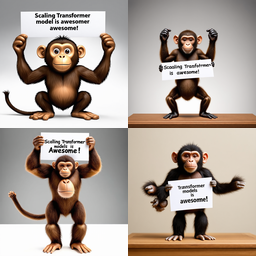

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=1


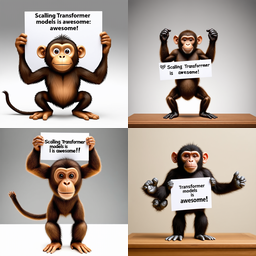

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=0


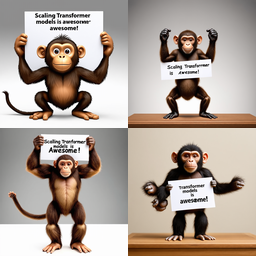

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=23


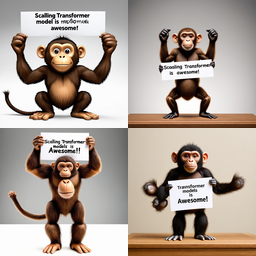

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=22


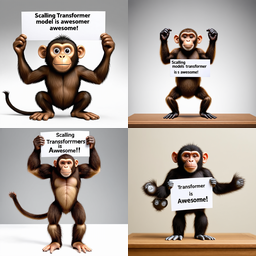

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=21


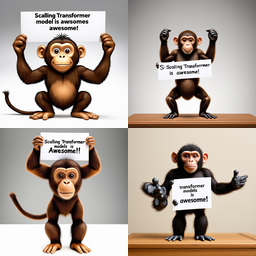

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=20


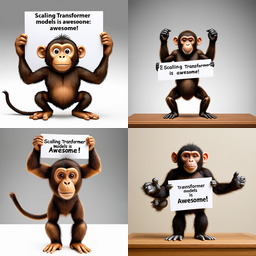

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=19


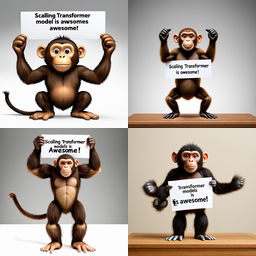

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=18


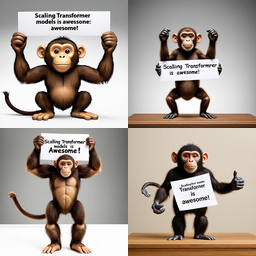

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=17


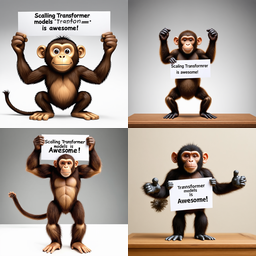

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=16


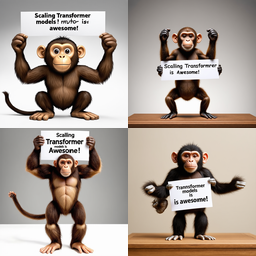

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=15


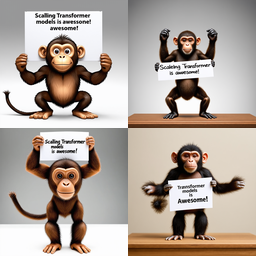

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=14


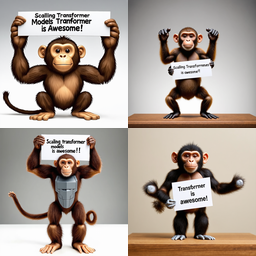

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=13


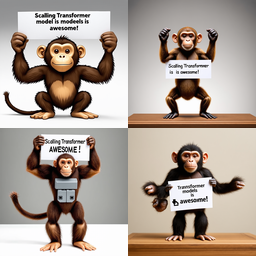

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=12


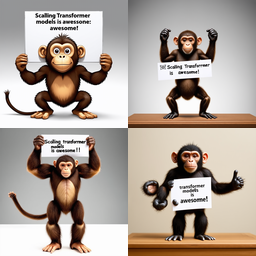

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=11


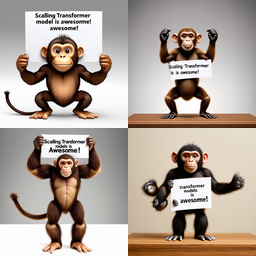

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=10


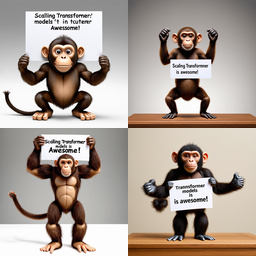

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=9


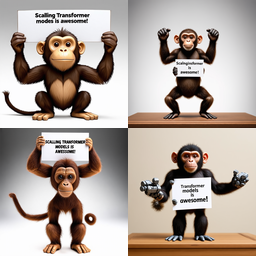

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=8


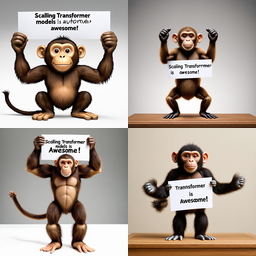

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=7


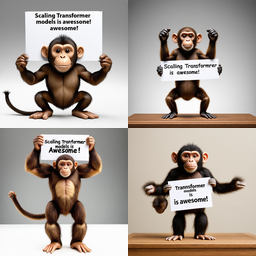

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=6


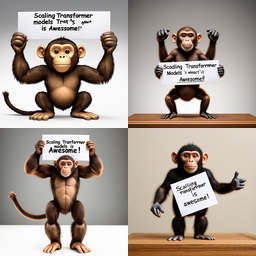

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=5


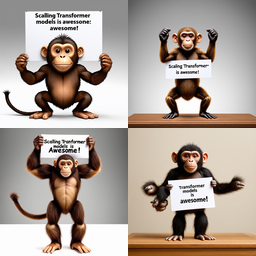

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=4


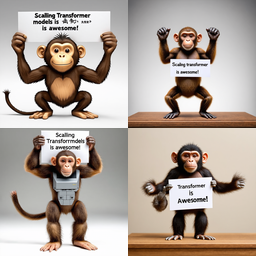

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=3


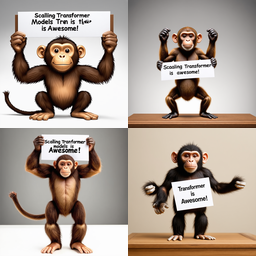

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=2


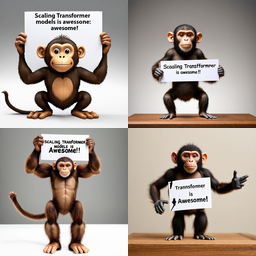

  0%|          | 0/28 [00:00<?, ?it/s]

zero abl head_i=1



KeyboardInterrupt



In [36]:
layer_heads = []
for layer in range(NUM_LAYERS):
    for head in range(NUM_HEADS):
        layer_heads.append((layer, head))

for layer, head in tqdm(list(reversed(layer_heads))):
    images, image_paths = run_head_ablation_experiment(layer=layer, head=head)
    display(create_collage(images, size=(256, 256)))

In [ ]:
heads_to_ablate = {
    0: [],
}

for layer, head_idx in heads_to_ablate.items():
    pipe.transformer.transformer_blocks[layer].attn.processor = BANANA_ZERO_HEAD_ABL_JointAttnProcessor2_0(head_idx=head_idx)

In [ ]:
images = pipe(
    "A monkey holding a sign reading ”Scaling transformer models is awesome!",
    negative_prompt="",
    num_inference_steps=28,
    guidance_scale=7.0,
    num_images_per_prompt=1,
    generator = torch.Generator(device="cuda:0").manual_seed(42)
).images

  0%|          | 0/28 [00:00<?, ?it/s]

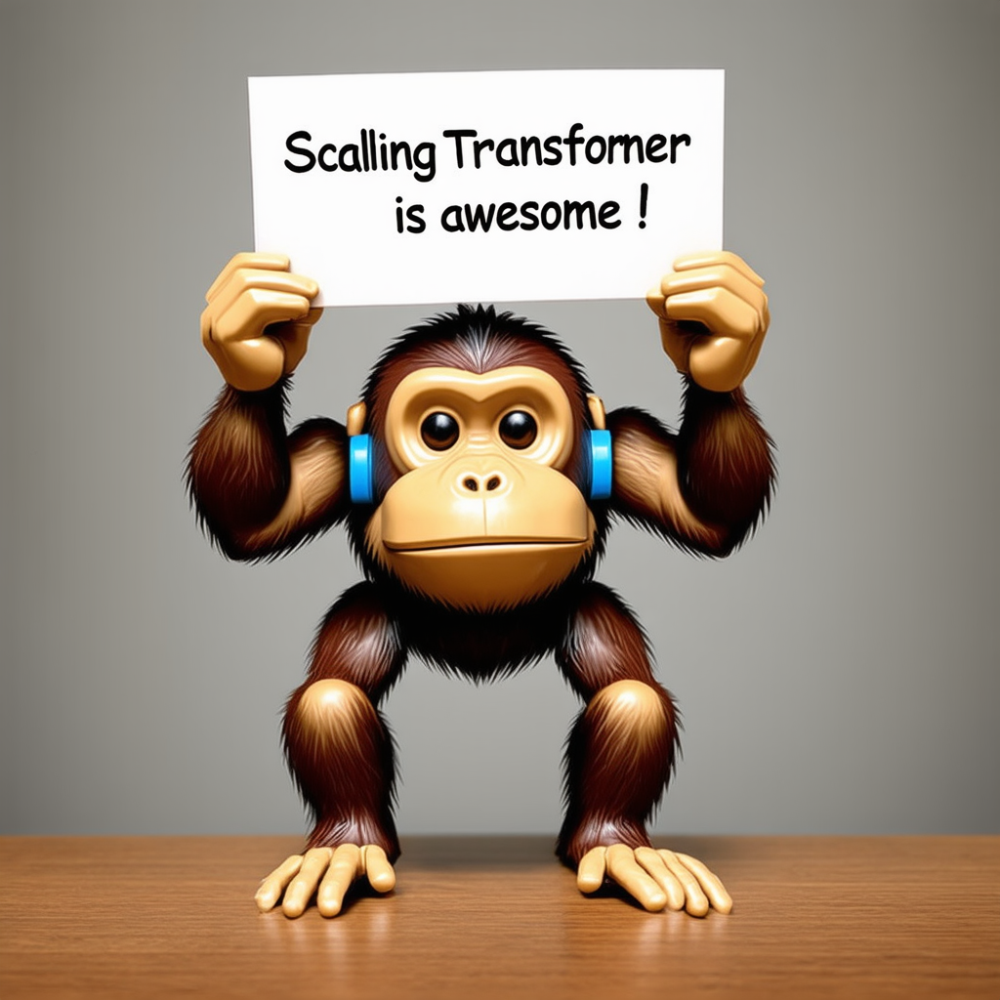

In [ ]:
images[0]